In [1]:
import torch
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np

import sys
import os
sys.path.append(os.path.abspath(os.path.join("..", "src")))
from prepare_dataset import get_dataloaders
from models import SRCNN
from utils import train_model, save_results, load_results, evaluate_model_on_sets
%load_ext autoreload
%autoreload 2

In [2]:
# variable definitions
factor = 2
device = torch.device("cuda")
model_name = "srcnn"
criterion = torch.nn.MSELoss()
MODEL_CLASS = SRCNN
train_epochs, ft_epochs = 1000, 1000
train_lr, ft_lr = 1e-4, 1e-4

### Train

In [3]:
model = MODEL_CLASS(upsample_factor=factor, middle_k_size=3)
train_loader, val_loader = get_dataloaders(factor, n_workers_train=0, n_workers_val=0)
print(summary(model, input_size=(1, 1, 33, 33), device=device.type))

Layer (type:depth-idx)                   Output Shape              Param #
SRCNN                                    [1, 1, 66, 66]            --
├─Sequential: 1-1                        [1, 1, 66, 66]            --
│    └─Conv2d: 2-1                       [1, 64, 66, 66]           5,248
│    └─ReLU: 2-2                         [1, 64, 66, 66]           --
│    └─Conv2d: 2-3                       [1, 32, 66, 66]           18,464
│    └─ReLU: 2-4                         [1, 32, 66, 66]           --
│    └─Conv2d: 2-5                       [1, 1, 66, 66]            801
Total params: 24,513
Trainable params: 24,513
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 106.78
Input size (MB): 0.00
Forward/backward pass size (MB): 3.38
Params size (MB): 0.10
Estimated Total Size (MB): 3.48


In [4]:
train_loss, val_loss, psnr_list = train_model(model, train_loader, val_loader, factor, num_epochs=train_epochs, lr=train_lr, criterion=criterion)
save_results(model, train_loss, val_loss, psnr_list, model_name, factor)

Epoch 1/1000 - Training: 100%|██████████| 78/78 [00:28<00:00,  2.78it/s]


[Epoch 1] Train Loss: 0.061565
[Epoch 1] Validation Loss: 0.003624, PSNR: 25.56


Epoch 2/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 2] Train Loss: 0.002602
[Epoch 2] Validation Loss: 0.001663, PSNR: 29.85


Epoch 3/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 3] Train Loss: 0.001409
[Epoch 3] Validation Loss: 0.001290, PSNR: 31.36


Epoch 4/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 4] Train Loss: 0.001095
[Epoch 4] Validation Loss: 0.001163, PSNR: 32.05


Epoch 5/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 5] Train Loss: 0.001000
[Epoch 5] Validation Loss: 0.001125, PSNR: 32.28


Epoch 6/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 6] Train Loss: 0.000966
[Epoch 6] Validation Loss: 0.001104, PSNR: 32.40


Epoch 7/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 7] Train Loss: 0.000945
[Epoch 7] Validation Loss: 0.001091, PSNR: 32.48


Epoch 8/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 8] Train Loss: 0.000932
[Epoch 8] Validation Loss: 0.001081, PSNR: 32.54


Epoch 9/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 9] Train Loss: 0.000921
[Epoch 9] Validation Loss: 0.001074, PSNR: 32.57


Epoch 10/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 10] Train Loss: 0.000911
[Epoch 10] Validation Loss: 0.001067, PSNR: 32.62


Epoch 11/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 11] Train Loss: 0.000906
[Epoch 11] Validation Loss: 0.001061, PSNR: 32.65


Epoch 12/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 12] Train Loss: 0.000900
[Epoch 12] Validation Loss: 0.001057, PSNR: 32.68


Epoch 13/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 13] Train Loss: 0.000894
[Epoch 13] Validation Loss: 0.001054, PSNR: 32.69


Epoch 14/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 14] Train Loss: 0.000889
[Epoch 14] Validation Loss: 0.001049, PSNR: 32.72


Epoch 15/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 15] Train Loss: 0.000885
[Epoch 15] Validation Loss: 0.001046, PSNR: 32.74


Epoch 16/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 16] Train Loss: 0.000882
[Epoch 16] Validation Loss: 0.001043, PSNR: 32.76


Epoch 17/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 17] Train Loss: 0.000879
[Epoch 17] Validation Loss: 0.001041, PSNR: 32.77


Epoch 18/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 18] Train Loss: 0.000874
[Epoch 18] Validation Loss: 0.001041, PSNR: 32.76
No improvement for 1 epochs.


Epoch 19/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 19] Train Loss: 0.000872
[Epoch 19] Validation Loss: 0.001037, PSNR: 32.79


Epoch 20/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 20] Train Loss: 0.000870
[Epoch 20] Validation Loss: 0.001034, PSNR: 32.81


Epoch 21/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 21] Train Loss: 0.000867
[Epoch 21] Validation Loss: 0.001034, PSNR: 32.80


Epoch 22/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 22] Train Loss: 0.000865
[Epoch 22] Validation Loss: 0.001030, PSNR: 32.83


Epoch 23/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 23] Train Loss: 0.000862
[Epoch 23] Validation Loss: 0.001028, PSNR: 32.85


Epoch 24/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 24] Train Loss: 0.000861
[Epoch 24] Validation Loss: 0.001026, PSNR: 32.86


Epoch 25/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 25] Train Loss: 0.000859
[Epoch 25] Validation Loss: 0.001026, PSNR: 32.86


Epoch 26/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 26] Train Loss: 0.000855
[Epoch 26] Validation Loss: 0.001024, PSNR: 32.87


Epoch 27/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 27] Train Loss: 0.000854
[Epoch 27] Validation Loss: 0.001022, PSNR: 32.88


Epoch 28/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 28] Train Loss: 0.000850
[Epoch 28] Validation Loss: 0.001022, PSNR: 32.88


Epoch 29/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 29] Train Loss: 0.000850
[Epoch 29] Validation Loss: 0.001020, PSNR: 32.90


Epoch 30/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 30] Train Loss: 0.000847
[Epoch 30] Validation Loss: 0.001019, PSNR: 32.89


Epoch 31/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 31] Train Loss: 0.000847
[Epoch 31] Validation Loss: 0.001017, PSNR: 32.91


Epoch 32/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 32] Train Loss: 0.000844
[Epoch 32] Validation Loss: 0.001017, PSNR: 32.91


Epoch 33/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 33] Train Loss: 0.000844
[Epoch 33] Validation Loss: 0.001016, PSNR: 32.91


Epoch 34/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 34] Train Loss: 0.000842
[Epoch 34] Validation Loss: 0.001014, PSNR: 32.93


Epoch 35/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 35] Train Loss: 0.000843
[Epoch 35] Validation Loss: 0.001013, PSNR: 32.93


Epoch 36/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 36] Train Loss: 0.000839
[Epoch 36] Validation Loss: 0.001012, PSNR: 32.94


Epoch 37/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 37] Train Loss: 0.000837
[Epoch 37] Validation Loss: 0.001014, PSNR: 32.91
No improvement for 1 epochs.


Epoch 38/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 38] Train Loss: 0.000836
[Epoch 38] Validation Loss: 0.001016, PSNR: 32.88
No improvement for 2 epochs.


Epoch 39/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 39] Train Loss: 0.000834
[Epoch 39] Validation Loss: 0.001009, PSNR: 32.96


Epoch 40/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 40] Train Loss: 0.000836
[Epoch 40] Validation Loss: 0.001009, PSNR: 32.96


Epoch 41/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 41] Train Loss: 0.000831
[Epoch 41] Validation Loss: 0.001008, PSNR: 32.97


Epoch 42/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 42] Train Loss: 0.000831
[Epoch 42] Validation Loss: 0.001007, PSNR: 32.97


Epoch 43/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 43] Train Loss: 0.000829
[Epoch 43] Validation Loss: 0.001006, PSNR: 32.98


Epoch 44/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 44] Train Loss: 0.000829
[Epoch 44] Validation Loss: 0.001007, PSNR: 32.96
No improvement for 1 epochs.


Epoch 45/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 45] Train Loss: 0.000829
[Epoch 45] Validation Loss: 0.001005, PSNR: 32.99


Epoch 46/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 46] Train Loss: 0.000825
[Epoch 46] Validation Loss: 0.001003, PSNR: 33.00


Epoch 47/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 47] Train Loss: 0.000823
[Epoch 47] Validation Loss: 0.001003, PSNR: 33.00


Epoch 48/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 48] Train Loss: 0.000821
[Epoch 48] Validation Loss: 0.001002, PSNR: 33.01


Epoch 49/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 49] Train Loss: 0.000822
[Epoch 49] Validation Loss: 0.001002, PSNR: 33.01


Epoch 50/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 50] Train Loss: 0.000823
[Epoch 50] Validation Loss: 0.001002, PSNR: 33.01
No improvement for 1 epochs.


Epoch 51/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 51] Train Loss: 0.000820
[Epoch 51] Validation Loss: 0.001001, PSNR: 33.01


Epoch 52/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 52] Train Loss: 0.000819
[Epoch 52] Validation Loss: 0.000999, PSNR: 33.04


Epoch 53/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 53] Train Loss: 0.000816
[Epoch 53] Validation Loss: 0.000999, PSNR: 33.03
No improvement for 1 epochs.


Epoch 54/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 54] Train Loss: 0.000817
[Epoch 54] Validation Loss: 0.000998, PSNR: 33.05


Epoch 55/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 55] Train Loss: 0.000813
[Epoch 55] Validation Loss: 0.001001, PSNR: 33.00
No improvement for 1 epochs.


Epoch 56/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 56] Train Loss: 0.000814
[Epoch 56] Validation Loss: 0.001004, PSNR: 32.96
No improvement for 2 epochs.


Epoch 57/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 57] Train Loss: 0.000811
[Epoch 57] Validation Loss: 0.000997, PSNR: 33.04


Epoch 58/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 58] Train Loss: 0.000812
[Epoch 58] Validation Loss: 0.000995, PSNR: 33.07


Epoch 59/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 59] Train Loss: 0.000808
[Epoch 59] Validation Loss: 0.000994, PSNR: 33.06


Epoch 60/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 60] Train Loss: 0.000809
[Epoch 60] Validation Loss: 0.000994, PSNR: 33.07


Epoch 61/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 61] Train Loss: 0.000805
[Epoch 61] Validation Loss: 0.000992, PSNR: 33.10


Epoch 62/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 62] Train Loss: 0.000806
[Epoch 62] Validation Loss: 0.000991, PSNR: 33.10


Epoch 63/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 63] Train Loss: 0.000809
[Epoch 63] Validation Loss: 0.000995, PSNR: 33.04
No improvement for 1 epochs.


Epoch 64/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 64] Train Loss: 0.000803
[Epoch 64] Validation Loss: 0.000990, PSNR: 33.12


Epoch 65/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 65] Train Loss: 0.000800
[Epoch 65] Validation Loss: 0.000990, PSNR: 33.12


Epoch 66/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 66] Train Loss: 0.000800
[Epoch 66] Validation Loss: 0.000989, PSNR: 33.13


Epoch 67/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 67] Train Loss: 0.000804
[Epoch 67] Validation Loss: 0.000995, PSNR: 33.04
No improvement for 1 epochs.


Epoch 68/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 68] Train Loss: 0.000798
[Epoch 68] Validation Loss: 0.000987, PSNR: 33.14


Epoch 69/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 69] Train Loss: 0.000796
[Epoch 69] Validation Loss: 0.000988, PSNR: 33.13
No improvement for 1 epochs.


Epoch 70/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 70] Train Loss: 0.000796
[Epoch 70] Validation Loss: 0.000989, PSNR: 33.11
No improvement for 2 epochs.


Epoch 71/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 71] Train Loss: 0.000795
[Epoch 71] Validation Loss: 0.000986, PSNR: 33.14


Epoch 72/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 72] Train Loss: 0.000793
[Epoch 72] Validation Loss: 0.000984, PSNR: 33.16


Epoch 73/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 73] Train Loss: 0.000818
[Epoch 73] Validation Loss: 0.000998, PSNR: 32.98
No improvement for 1 epochs.


Epoch 74/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 74] Train Loss: 0.000792
[Epoch 74] Validation Loss: 0.000983, PSNR: 33.18


Epoch 75/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 75] Train Loss: 0.000789
[Epoch 75] Validation Loss: 0.000982, PSNR: 33.18


Epoch 76/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 76] Train Loss: 0.000789
[Epoch 76] Validation Loss: 0.000981, PSNR: 33.19


Epoch 77/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 77] Train Loss: 0.000788
[Epoch 77] Validation Loss: 0.000980, PSNR: 33.19


Epoch 78/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 78] Train Loss: 0.000787
[Epoch 78] Validation Loss: 0.000980, PSNR: 33.20
No improvement for 1 epochs.


Epoch 79/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 79] Train Loss: 0.000786
[Epoch 79] Validation Loss: 0.000979, PSNR: 33.20


Epoch 80/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 80] Train Loss: 0.000785
[Epoch 80] Validation Loss: 0.000979, PSNR: 33.21
No improvement for 1 epochs.


Epoch 81/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 81] Train Loss: 0.000786
[Epoch 81] Validation Loss: 0.000981, PSNR: 33.17
No improvement for 2 epochs.


Epoch 82/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 82] Train Loss: 0.000787
[Epoch 82] Validation Loss: 0.000989, PSNR: 33.07
No improvement for 3 epochs.


Epoch 83/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 83] Train Loss: 0.000786
[Epoch 83] Validation Loss: 0.000977, PSNR: 33.22


Epoch 84/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 84] Train Loss: 0.000783
[Epoch 84] Validation Loss: 0.000979, PSNR: 33.20
No improvement for 1 epochs.


Epoch 85/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 85] Train Loss: 0.000784
[Epoch 85] Validation Loss: 0.000977, PSNR: 33.22
No improvement for 2 epochs.


Epoch 86/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 86] Train Loss: 0.000781
[Epoch 86] Validation Loss: 0.000975, PSNR: 33.23


Epoch 87/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 87] Train Loss: 0.000796
[Epoch 87] Validation Loss: 0.000975, PSNR: 33.23


Epoch 88/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 88] Train Loss: 0.000780
[Epoch 88] Validation Loss: 0.000974, PSNR: 33.25


Epoch 89/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 89] Train Loss: 0.000779
[Epoch 89] Validation Loss: 0.000973, PSNR: 33.25


Epoch 90/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 90] Train Loss: 0.000778
[Epoch 90] Validation Loss: 0.000973, PSNR: 33.26


Epoch 91/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 91] Train Loss: 0.000777
[Epoch 91] Validation Loss: 0.000973, PSNR: 33.26
No improvement for 1 epochs.


Epoch 92/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 92] Train Loss: 0.000776
[Epoch 92] Validation Loss: 0.000972, PSNR: 33.25


Epoch 93/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 93] Train Loss: 0.000788
[Epoch 93] Validation Loss: 0.000972, PSNR: 33.26
No improvement for 1 epochs.


Epoch 94/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 94] Train Loss: 0.000775
[Epoch 94] Validation Loss: 0.000970, PSNR: 33.27


Epoch 95/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 95] Train Loss: 0.000774
[Epoch 95] Validation Loss: 0.000970, PSNR: 33.28


Epoch 96/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 96] Train Loss: 0.000773
[Epoch 96] Validation Loss: 0.000969, PSNR: 33.28


Epoch 97/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 97] Train Loss: 0.000776
[Epoch 97] Validation Loss: 0.000970, PSNR: 33.28
No improvement for 1 epochs.


Epoch 98/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 98] Train Loss: 0.000774
[Epoch 98] Validation Loss: 0.000970, PSNR: 33.27
No improvement for 2 epochs.


Epoch 99/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 99] Train Loss: 0.000773
[Epoch 99] Validation Loss: 0.000968, PSNR: 33.29


Epoch 100/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 100] Train Loss: 0.000778
[Epoch 100] Validation Loss: 0.000967, PSNR: 33.30


Epoch 101/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 101] Train Loss: 0.000772
[Epoch 101] Validation Loss: 0.000967, PSNR: 33.30


Epoch 102/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 102] Train Loss: 0.000771
[Epoch 102] Validation Loss: 0.000967, PSNR: 33.30
No improvement for 1 epochs.


Epoch 103/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 103] Train Loss: 0.000771
[Epoch 103] Validation Loss: 0.000969, PSNR: 33.28
No improvement for 2 epochs.


Epoch 104/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 104] Train Loss: 0.000771
[Epoch 104] Validation Loss: 0.000966, PSNR: 33.31


Epoch 105/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 105] Train Loss: 0.000778
[Epoch 105] Validation Loss: 0.000968, PSNR: 33.28
No improvement for 1 epochs.


Epoch 106/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 106] Train Loss: 0.000768
[Epoch 106] Validation Loss: 0.000965, PSNR: 33.32


Epoch 107/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 107] Train Loss: 0.000767
[Epoch 107] Validation Loss: 0.000965, PSNR: 33.33


Epoch 108/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 108] Train Loss: 0.000766
[Epoch 108] Validation Loss: 0.000965, PSNR: 33.32
No improvement for 1 epochs.


Epoch 109/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 109] Train Loss: 0.000775
[Epoch 109] Validation Loss: 0.000966, PSNR: 33.29
No improvement for 2 epochs.


Epoch 110/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 110] Train Loss: 0.000764
[Epoch 110] Validation Loss: 0.000963, PSNR: 33.33


Epoch 111/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 111] Train Loss: 0.000764
[Epoch 111] Validation Loss: 0.000962, PSNR: 33.33


Epoch 112/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 112] Train Loss: 0.000764
[Epoch 112] Validation Loss: 0.000961, PSNR: 33.34


Epoch 113/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 113] Train Loss: 0.000765
[Epoch 113] Validation Loss: 0.000962, PSNR: 33.33
No improvement for 1 epochs.


Epoch 114/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 114] Train Loss: 0.000766
[Epoch 114] Validation Loss: 0.000960, PSNR: 33.36


Epoch 115/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 115] Train Loss: 0.000761
[Epoch 115] Validation Loss: 0.000960, PSNR: 33.36


Epoch 116/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 116] Train Loss: 0.000771
[Epoch 116] Validation Loss: 0.000967, PSNR: 33.25
No improvement for 1 epochs.


Epoch 117/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 117] Train Loss: 0.000762
[Epoch 117] Validation Loss: 0.000959, PSNR: 33.37


Epoch 118/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 118] Train Loss: 0.000760
[Epoch 118] Validation Loss: 0.000959, PSNR: 33.36


Epoch 119/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 119] Train Loss: 0.000759
[Epoch 119] Validation Loss: 0.000959, PSNR: 33.37


Epoch 120/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 120] Train Loss: 0.000760
[Epoch 120] Validation Loss: 0.000958, PSNR: 33.38


Epoch 121/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 121] Train Loss: 0.000766
[Epoch 121] Validation Loss: 0.000957, PSNR: 33.38


Epoch 122/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 122] Train Loss: 0.000758
[Epoch 122] Validation Loss: 0.000957, PSNR: 33.38
No improvement for 1 epochs.


Epoch 123/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 123] Train Loss: 0.000757
[Epoch 123] Validation Loss: 0.000958, PSNR: 33.36
No improvement for 2 epochs.


Epoch 124/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 124] Train Loss: 0.000759
[Epoch 124] Validation Loss: 0.000959, PSNR: 33.33
No improvement for 3 epochs.


Epoch 125/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.13it/s]


[Epoch 125] Train Loss: 0.000758
[Epoch 125] Validation Loss: 0.000959, PSNR: 33.36
No improvement for 4 epochs.


Epoch 126/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 126] Train Loss: 0.000756
[Epoch 126] Validation Loss: 0.000956, PSNR: 33.39


Epoch 127/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 127] Train Loss: 0.000758
[Epoch 127] Validation Loss: 0.000957, PSNR: 33.37
No improvement for 1 epochs.


Epoch 128/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 128] Train Loss: 0.000753
[Epoch 128] Validation Loss: 0.000954, PSNR: 33.41


Epoch 129/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 129] Train Loss: 0.000758
[Epoch 129] Validation Loss: 0.000961, PSNR: 33.30
No improvement for 1 epochs.


Epoch 130/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 130] Train Loss: 0.000757
[Epoch 130] Validation Loss: 0.000956, PSNR: 33.39
No improvement for 2 epochs.


Epoch 131/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 131] Train Loss: 0.000753
[Epoch 131] Validation Loss: 0.000953, PSNR: 33.42


Epoch 132/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 132] Train Loss: 0.000754
[Epoch 132] Validation Loss: 0.000952, PSNR: 33.42


Epoch 133/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 133] Train Loss: 0.000752
[Epoch 133] Validation Loss: 0.000956, PSNR: 33.36
No improvement for 1 epochs.


Epoch 134/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 134] Train Loss: 0.000754
[Epoch 134] Validation Loss: 0.000952, PSNR: 33.42
No improvement for 2 epochs.


Epoch 135/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 135] Train Loss: 0.000754
[Epoch 135] Validation Loss: 0.000951, PSNR: 33.43


Epoch 136/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 136] Train Loss: 0.000750
[Epoch 136] Validation Loss: 0.000951, PSNR: 33.43
No improvement for 1 epochs.


Epoch 137/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 137] Train Loss: 0.000762
[Epoch 137] Validation Loss: 0.000966, PSNR: 33.22
No improvement for 2 epochs.


Epoch 138/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 138] Train Loss: 0.000750
[Epoch 138] Validation Loss: 0.000951, PSNR: 33.44
No improvement for 3 epochs.


Epoch 139/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 139] Train Loss: 0.000748
[Epoch 139] Validation Loss: 0.000950, PSNR: 33.45


Epoch 140/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 140] Train Loss: 0.000748
[Epoch 140] Validation Loss: 0.000949, PSNR: 33.44


Epoch 141/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 141] Train Loss: 0.000748
[Epoch 141] Validation Loss: 0.000949, PSNR: 33.45
No improvement for 1 epochs.


Epoch 142/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 142] Train Loss: 0.000751
[Epoch 142] Validation Loss: 0.000949, PSNR: 33.45


Epoch 143/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 143] Train Loss: 0.000746
[Epoch 143] Validation Loss: 0.000948, PSNR: 33.45


Epoch 144/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 144] Train Loss: 0.000747
[Epoch 144] Validation Loss: 0.000948, PSNR: 33.45


Epoch 145/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 145] Train Loss: 0.000761
[Epoch 145] Validation Loss: 0.000948, PSNR: 33.44
No improvement for 1 epochs.


Epoch 146/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 146] Train Loss: 0.000749
[Epoch 146] Validation Loss: 0.000948, PSNR: 33.46
No improvement for 2 epochs.


Epoch 147/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 147] Train Loss: 0.000746
[Epoch 147] Validation Loss: 0.000946, PSNR: 33.47


Epoch 148/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 148] Train Loss: 0.000744
[Epoch 148] Validation Loss: 0.000946, PSNR: 33.47
No improvement for 1 epochs.


Epoch 149/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 149] Train Loss: 0.000744
[Epoch 149] Validation Loss: 0.000945, PSNR: 33.47


Epoch 150/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 150] Train Loss: 0.000744
[Epoch 150] Validation Loss: 0.000945, PSNR: 33.47
No improvement for 1 epochs.


Epoch 151/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 151] Train Loss: 0.000744
[Epoch 151] Validation Loss: 0.000945, PSNR: 33.47


Epoch 152/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 152] Train Loss: 0.000744
[Epoch 152] Validation Loss: 0.000945, PSNR: 33.48


Epoch 153/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 153] Train Loss: 0.000742
[Epoch 153] Validation Loss: 0.000944, PSNR: 33.49


Epoch 154/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 154] Train Loss: 0.000747
[Epoch 154] Validation Loss: 0.000946, PSNR: 33.44
No improvement for 1 epochs.


Epoch 155/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 155] Train Loss: 0.000743
[Epoch 155] Validation Loss: 0.000945, PSNR: 33.47
No improvement for 2 epochs.


Epoch 156/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 156] Train Loss: 0.000744
[Epoch 156] Validation Loss: 0.000943, PSNR: 33.49


Epoch 157/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 157] Train Loss: 0.000741
[Epoch 157] Validation Loss: 0.000943, PSNR: 33.50


Epoch 158/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 158] Train Loss: 0.000740
[Epoch 158] Validation Loss: 0.000944, PSNR: 33.49
No improvement for 1 epochs.


Epoch 159/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 159] Train Loss: 0.000745
[Epoch 159] Validation Loss: 0.000941, PSNR: 33.50


Epoch 160/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 160] Train Loss: 0.000740
[Epoch 160] Validation Loss: 0.000942, PSNR: 33.50
No improvement for 1 epochs.


Epoch 161/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 161] Train Loss: 0.000740
[Epoch 161] Validation Loss: 0.000941, PSNR: 33.51


Epoch 162/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 162] Train Loss: 0.000741
[Epoch 162] Validation Loss: 0.000941, PSNR: 33.51
No improvement for 1 epochs.


Epoch 163/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 163] Train Loss: 0.000742
[Epoch 163] Validation Loss: 0.000941, PSNR: 33.51


Epoch 164/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 164] Train Loss: 0.000738
[Epoch 164] Validation Loss: 0.000940, PSNR: 33.51


Epoch 165/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 165] Train Loss: 0.000742
[Epoch 165] Validation Loss: 0.000940, PSNR: 33.50


Epoch 166/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 166] Train Loss: 0.000738
[Epoch 166] Validation Loss: 0.000940, PSNR: 33.52


Epoch 167/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 167] Train Loss: 0.000737
[Epoch 167] Validation Loss: 0.000939, PSNR: 33.52


Epoch 168/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 168] Train Loss: 0.000738
[Epoch 168] Validation Loss: 0.000939, PSNR: 33.52
No improvement for 1 epochs.


Epoch 169/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 169] Train Loss: 0.000739
[Epoch 169] Validation Loss: 0.001010, PSNR: 32.64
No improvement for 2 epochs.


Epoch 170/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 170] Train Loss: 0.000741
[Epoch 170] Validation Loss: 0.000938, PSNR: 33.53


Epoch 171/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 171] Train Loss: 0.000735
[Epoch 171] Validation Loss: 0.000937, PSNR: 33.53


Epoch 172/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 172] Train Loss: 0.000736
[Epoch 172] Validation Loss: 0.000949, PSNR: 33.36
No improvement for 1 epochs.


Epoch 173/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 173] Train Loss: 0.000738
[Epoch 173] Validation Loss: 0.000938, PSNR: 33.52
No improvement for 2 epochs.


Epoch 174/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 174] Train Loss: 0.000735
[Epoch 174] Validation Loss: 0.000943, PSNR: 33.44
No improvement for 3 epochs.


Epoch 175/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 175] Train Loss: 0.000738
[Epoch 175] Validation Loss: 0.000937, PSNR: 33.54


Epoch 176/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 176] Train Loss: 0.000733
[Epoch 176] Validation Loss: 0.000936, PSNR: 33.54


Epoch 177/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 177] Train Loss: 0.000736
[Epoch 177] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 178/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 178] Train Loss: 0.000734
[Epoch 178] Validation Loss: 0.000936, PSNR: 33.54


Epoch 179/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 179] Train Loss: 0.000735
[Epoch 179] Validation Loss: 0.000937, PSNR: 33.53
No improvement for 1 epochs.


Epoch 180/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 180] Train Loss: 0.000734
[Epoch 180] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 2 epochs.


Epoch 181/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 181] Train Loss: 0.000732
[Epoch 181] Validation Loss: 0.000935, PSNR: 33.55


Epoch 182/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 182] Train Loss: 0.000737
[Epoch 182] Validation Loss: 0.000934, PSNR: 33.55


Epoch 183/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 183] Train Loss: 0.000732
[Epoch 183] Validation Loss: 0.000934, PSNR: 33.56


Epoch 184/1000 - Training: 100%|██████████| 78/78 [00:28<00:00,  2.71it/s]


[Epoch 184] Train Loss: 0.000731
[Epoch 184] Validation Loss: 0.000935, PSNR: 33.55
No improvement for 1 epochs.


Epoch 185/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.08it/s]


[Epoch 185] Train Loss: 0.000736
[Epoch 185] Validation Loss: 0.000947, PSNR: 33.38
No improvement for 2 epochs.


Epoch 186/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 186] Train Loss: 0.000732
[Epoch 186] Validation Loss: 0.000933, PSNR: 33.56


Epoch 187/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 187] Train Loss: 0.000730
[Epoch 187] Validation Loss: 0.000933, PSNR: 33.57


Epoch 188/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 188] Train Loss: 0.000730
[Epoch 188] Validation Loss: 0.000933, PSNR: 33.57


Epoch 189/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 189] Train Loss: 0.000742
[Epoch 189] Validation Loss: 0.000936, PSNR: 33.53
No improvement for 1 epochs.


Epoch 190/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 190] Train Loss: 0.000729
[Epoch 190] Validation Loss: 0.000933, PSNR: 33.57


Epoch 191/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 191] Train Loss: 0.000728
[Epoch 191] Validation Loss: 0.000932, PSNR: 33.57


Epoch 192/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 192] Train Loss: 0.000729
[Epoch 192] Validation Loss: 0.000932, PSNR: 33.58
No improvement for 1 epochs.


Epoch 193/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 193] Train Loss: 0.000728
[Epoch 193] Validation Loss: 0.000932, PSNR: 33.58


Epoch 194/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 194] Train Loss: 0.000729
[Epoch 194] Validation Loss: 0.000931, PSNR: 33.58


Epoch 195/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 195] Train Loss: 0.000737
[Epoch 195] Validation Loss: 0.000950, PSNR: 33.30
No improvement for 1 epochs.


Epoch 196/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 196] Train Loss: 0.000729
[Epoch 196] Validation Loss: 0.000932, PSNR: 33.58
No improvement for 2 epochs.


Epoch 197/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 197] Train Loss: 0.000727
[Epoch 197] Validation Loss: 0.000932, PSNR: 33.58
No improvement for 3 epochs.


Epoch 198/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 198] Train Loss: 0.000726
[Epoch 198] Validation Loss: 0.000930, PSNR: 33.58


Epoch 199/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 199] Train Loss: 0.000727
[Epoch 199] Validation Loss: 0.000930, PSNR: 33.59


Epoch 200/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 200] Train Loss: 0.000728
[Epoch 200] Validation Loss: 0.000937, PSNR: 33.50
No improvement for 1 epochs.


Epoch 201/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 201] Train Loss: 0.000727
[Epoch 201] Validation Loss: 0.000929, PSNR: 33.59


Epoch 202/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 202] Train Loss: 0.000731
[Epoch 202] Validation Loss: 0.000930, PSNR: 33.59
No improvement for 1 epochs.


Epoch 203/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 203] Train Loss: 0.000727
[Epoch 203] Validation Loss: 0.000929, PSNR: 33.59


Epoch 204/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 204] Train Loss: 0.000727
[Epoch 204] Validation Loss: 0.000929, PSNR: 33.60
No improvement for 1 epochs.


Epoch 205/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 205] Train Loss: 0.000729
[Epoch 205] Validation Loss: 0.000945, PSNR: 33.36
No improvement for 2 epochs.


Epoch 206/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 206] Train Loss: 0.000728
[Epoch 206] Validation Loss: 0.000930, PSNR: 33.58
No improvement for 3 epochs.


Epoch 207/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 207] Train Loss: 0.000726
[Epoch 207] Validation Loss: 0.000937, PSNR: 33.48
No improvement for 4 epochs.


Epoch 208/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 208] Train Loss: 0.000725
[Epoch 208] Validation Loss: 0.000929, PSNR: 33.60
No improvement for 5 epochs.


Epoch 209/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 209] Train Loss: 0.000725
[Epoch 209] Validation Loss: 0.000929, PSNR: 33.60


Epoch 210/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 210] Train Loss: 0.000726
[Epoch 210] Validation Loss: 0.000933, PSNR: 33.53
No improvement for 1 epochs.


Epoch 211/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 211] Train Loss: 0.000724
[Epoch 211] Validation Loss: 0.000928, PSNR: 33.60


Epoch 212/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 212] Train Loss: 0.000729
[Epoch 212] Validation Loss: 0.000971, PSNR: 33.01
No improvement for 1 epochs.


Epoch 213/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 213] Train Loss: 0.000727
[Epoch 213] Validation Loss: 0.000927, PSNR: 33.60


Epoch 214/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 214] Train Loss: 0.000725
[Epoch 214] Validation Loss: 0.000927, PSNR: 33.61


Epoch 215/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 215] Train Loss: 0.000722
[Epoch 215] Validation Loss: 0.000933, PSNR: 33.53
No improvement for 1 epochs.


Epoch 216/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 216] Train Loss: 0.000723
[Epoch 216] Validation Loss: 0.000927, PSNR: 33.61
No improvement for 2 epochs.


Epoch 217/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 217] Train Loss: 0.000728
[Epoch 217] Validation Loss: 0.000929, PSNR: 33.58
No improvement for 3 epochs.


Epoch 218/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 218] Train Loss: 0.000722
[Epoch 218] Validation Loss: 0.000926, PSNR: 33.62


Epoch 219/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 219] Train Loss: 0.000722
[Epoch 219] Validation Loss: 0.000926, PSNR: 33.62
No improvement for 1 epochs.


Epoch 220/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 220] Train Loss: 0.000723
[Epoch 220] Validation Loss: 0.000928, PSNR: 33.60
No improvement for 2 epochs.


Epoch 221/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 221] Train Loss: 0.000725
[Epoch 221] Validation Loss: 0.000926, PSNR: 33.62


Epoch 222/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 222] Train Loss: 0.000721
[Epoch 222] Validation Loss: 0.000925, PSNR: 33.63


Epoch 223/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 223] Train Loss: 0.000720
[Epoch 223] Validation Loss: 0.000926, PSNR: 33.62
No improvement for 1 epochs.


Epoch 224/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 224] Train Loss: 0.000722
[Epoch 224] Validation Loss: 0.000925, PSNR: 33.62
No improvement for 2 epochs.


Epoch 225/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 225] Train Loss: 0.000723
[Epoch 225] Validation Loss: 0.000935, PSNR: 33.49
No improvement for 3 epochs.


Epoch 226/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 226] Train Loss: 0.000721
[Epoch 226] Validation Loss: 0.000924, PSNR: 33.63


Epoch 227/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 227] Train Loss: 0.000720
[Epoch 227] Validation Loss: 0.000927, PSNR: 33.60
No improvement for 1 epochs.


Epoch 228/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 228] Train Loss: 0.000721
[Epoch 228] Validation Loss: 0.000926, PSNR: 33.60
No improvement for 2 epochs.


Epoch 229/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.12it/s]


[Epoch 229] Train Loss: 0.000721
[Epoch 229] Validation Loss: 0.000924, PSNR: 33.63


Epoch 230/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 230] Train Loss: 0.000721
[Epoch 230] Validation Loss: 0.000930, PSNR: 33.54
No improvement for 1 epochs.


Epoch 231/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 231] Train Loss: 0.000724
[Epoch 231] Validation Loss: 0.000924, PSNR: 33.64


Epoch 232/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 232] Train Loss: 0.000719
[Epoch 232] Validation Loss: 0.000924, PSNR: 33.64
No improvement for 1 epochs.


Epoch 233/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 233] Train Loss: 0.000720
[Epoch 233] Validation Loss: 0.000923, PSNR: 33.64


Epoch 234/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 234] Train Loss: 0.000719
[Epoch 234] Validation Loss: 0.000938, PSNR: 33.43
No improvement for 1 epochs.


Epoch 235/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 235] Train Loss: 0.000727
[Epoch 235] Validation Loss: 0.000923, PSNR: 33.64


Epoch 236/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 236] Train Loss: 0.000717
[Epoch 236] Validation Loss: 0.000923, PSNR: 33.64
No improvement for 1 epochs.


Epoch 237/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 237] Train Loss: 0.000718
[Epoch 237] Validation Loss: 0.000926, PSNR: 33.61
No improvement for 2 epochs.


Epoch 238/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 238] Train Loss: 0.000718
[Epoch 238] Validation Loss: 0.000923, PSNR: 33.64


Epoch 239/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 239] Train Loss: 0.000719
[Epoch 239] Validation Loss: 0.000924, PSNR: 33.62
No improvement for 1 epochs.


Epoch 240/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 240] Train Loss: 0.000719
[Epoch 240] Validation Loss: 0.000925, PSNR: 33.61
No improvement for 2 epochs.


Epoch 241/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 241] Train Loss: 0.000720
[Epoch 241] Validation Loss: 0.000923, PSNR: 33.64


Epoch 242/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 242] Train Loss: 0.000719
[Epoch 242] Validation Loss: 0.000925, PSNR: 33.61
No improvement for 1 epochs.


Epoch 243/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 243] Train Loss: 0.000719
[Epoch 243] Validation Loss: 0.000922, PSNR: 33.65


Epoch 244/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 244] Train Loss: 0.000718
[Epoch 244] Validation Loss: 0.000922, PSNR: 33.65


Epoch 245/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 245] Train Loss: 0.000721
[Epoch 245] Validation Loss: 0.000922, PSNR: 33.64
No improvement for 1 epochs.


Epoch 246/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 246] Train Loss: 0.000717
[Epoch 246] Validation Loss: 0.000922, PSNR: 33.65
No improvement for 2 epochs.


Epoch 247/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 247] Train Loss: 0.000717
[Epoch 247] Validation Loss: 0.000921, PSNR: 33.66


Epoch 248/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 248] Train Loss: 0.000718
[Epoch 248] Validation Loss: 0.000921, PSNR: 33.66
No improvement for 1 epochs.


Epoch 249/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 249] Train Loss: 0.000717
[Epoch 249] Validation Loss: 0.000921, PSNR: 33.66


Epoch 250/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 250] Train Loss: 0.000717
[Epoch 250] Validation Loss: 0.000933, PSNR: 33.48
No improvement for 1 epochs.


Epoch 251/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 251] Train Loss: 0.000716
[Epoch 251] Validation Loss: 0.000923, PSNR: 33.63
No improvement for 2 epochs.


Epoch 252/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 252] Train Loss: 0.000719
[Epoch 252] Validation Loss: 0.000920, PSNR: 33.66


Epoch 253/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 253] Train Loss: 0.000717
[Epoch 253] Validation Loss: 0.000923, PSNR: 33.60
No improvement for 1 epochs.


Epoch 254/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 254] Train Loss: 0.000716
[Epoch 254] Validation Loss: 0.000920, PSNR: 33.66
No improvement for 2 epochs.


Epoch 255/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 255] Train Loss: 0.000714
[Epoch 255] Validation Loss: 0.000920, PSNR: 33.66
No improvement for 3 epochs.


Epoch 256/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 256] Train Loss: 0.000716
[Epoch 256] Validation Loss: 0.000920, PSNR: 33.66


Epoch 257/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 257] Train Loss: 0.000721
[Epoch 257] Validation Loss: 0.000927, PSNR: 33.56
No improvement for 1 epochs.


Epoch 258/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 258] Train Loss: 0.000716
[Epoch 258] Validation Loss: 0.000919, PSNR: 33.67


Epoch 259/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 259] Train Loss: 0.000714
[Epoch 259] Validation Loss: 0.000920, PSNR: 33.66
No improvement for 1 epochs.


Epoch 260/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 260] Train Loss: 0.000715
[Epoch 260] Validation Loss: 0.000919, PSNR: 33.67


Epoch 261/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 261] Train Loss: 0.000717
[Epoch 261] Validation Loss: 0.000919, PSNR: 33.67
No improvement for 1 epochs.


Epoch 262/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 262] Train Loss: 0.000715
[Epoch 262] Validation Loss: 0.000920, PSNR: 33.65
No improvement for 2 epochs.


Epoch 263/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 263] Train Loss: 0.000715
[Epoch 263] Validation Loss: 0.000919, PSNR: 33.67


Epoch 264/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 264] Train Loss: 0.000714
[Epoch 264] Validation Loss: 0.000921, PSNR: 33.64
No improvement for 1 epochs.


Epoch 265/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 265] Train Loss: 0.000716
[Epoch 265] Validation Loss: 0.000928, PSNR: 33.54
No improvement for 2 epochs.


Epoch 266/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 266] Train Loss: 0.000715
[Epoch 266] Validation Loss: 0.000920, PSNR: 33.65
No improvement for 3 epochs.


Epoch 267/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 267] Train Loss: 0.000716
[Epoch 267] Validation Loss: 0.000919, PSNR: 33.67
No improvement for 4 epochs.


Epoch 268/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 268] Train Loss: 0.000713
[Epoch 268] Validation Loss: 0.000919, PSNR: 33.67
No improvement for 5 epochs.


Epoch 269/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 269] Train Loss: 0.000713
[Epoch 269] Validation Loss: 0.000918, PSNR: 33.67


Epoch 270/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 270] Train Loss: 0.000714
[Epoch 270] Validation Loss: 0.000918, PSNR: 33.68


Epoch 271/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 271] Train Loss: 0.000722
[Epoch 271] Validation Loss: 0.000918, PSNR: 33.68
No improvement for 1 epochs.


Epoch 272/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 272] Train Loss: 0.000712
[Epoch 272] Validation Loss: 0.000918, PSNR: 33.68
No improvement for 2 epochs.


Epoch 273/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.08it/s]


[Epoch 273] Train Loss: 0.000714
[Epoch 273] Validation Loss: 0.000917, PSNR: 33.69


Epoch 274/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 274] Train Loss: 0.000712
[Epoch 274] Validation Loss: 0.000917, PSNR: 33.69


Epoch 275/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 275] Train Loss: 0.000714
[Epoch 275] Validation Loss: 0.000918, PSNR: 33.68
No improvement for 1 epochs.


Epoch 276/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 276] Train Loss: 0.000712
[Epoch 276] Validation Loss: 0.000917, PSNR: 33.69
No improvement for 2 epochs.


Epoch 277/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 277] Train Loss: 0.000711
[Epoch 277] Validation Loss: 0.000917, PSNR: 33.69


Epoch 278/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 278] Train Loss: 0.000714
[Epoch 278] Validation Loss: 0.000918, PSNR: 33.68
No improvement for 1 epochs.


Epoch 279/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 279] Train Loss: 0.000712
[Epoch 279] Validation Loss: 0.000917, PSNR: 33.69
No improvement for 2 epochs.


Epoch 280/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 280] Train Loss: 0.000713
[Epoch 280] Validation Loss: 0.000917, PSNR: 33.68


Epoch 281/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 281] Train Loss: 0.000711
[Epoch 281] Validation Loss: 0.000916, PSNR: 33.69


Epoch 282/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 282] Train Loss: 0.000711
[Epoch 282] Validation Loss: 0.000916, PSNR: 33.69


Epoch 283/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 283] Train Loss: 0.000712
[Epoch 283] Validation Loss: 0.000916, PSNR: 33.69


Epoch 284/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 284] Train Loss: 0.000710
[Epoch 284] Validation Loss: 0.000916, PSNR: 33.69


Epoch 285/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 285] Train Loss: 0.000710
[Epoch 285] Validation Loss: 0.000916, PSNR: 33.69


Epoch 286/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 286] Train Loss: 0.000709
[Epoch 286] Validation Loss: 0.000916, PSNR: 33.69
No improvement for 1 epochs.


Epoch 287/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 287] Train Loss: 0.000711
[Epoch 287] Validation Loss: 0.000916, PSNR: 33.70
No improvement for 2 epochs.


Epoch 288/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 288] Train Loss: 0.000710
[Epoch 288] Validation Loss: 0.000916, PSNR: 33.70


Epoch 289/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 289] Train Loss: 0.000711
[Epoch 289] Validation Loss: 0.000916, PSNR: 33.70
No improvement for 1 epochs.


Epoch 290/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 290] Train Loss: 0.000710
[Epoch 290] Validation Loss: 0.000916, PSNR: 33.70
No improvement for 2 epochs.


Epoch 291/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 291] Train Loss: 0.000710
[Epoch 291] Validation Loss: 0.000915, PSNR: 33.70


Epoch 292/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 292] Train Loss: 0.000710
[Epoch 292] Validation Loss: 0.000915, PSNR: 33.70


Epoch 293/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 293] Train Loss: 0.000710
[Epoch 293] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 1 epochs.


Epoch 294/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 294] Train Loss: 0.000710
[Epoch 294] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 2 epochs.


Epoch 295/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 295] Train Loss: 0.000710
[Epoch 295] Validation Loss: 0.000916, PSNR: 33.70
No improvement for 3 epochs.


Epoch 296/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 296] Train Loss: 0.000709
[Epoch 296] Validation Loss: 0.000915, PSNR: 33.70


Epoch 297/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 297] Train Loss: 0.000709
[Epoch 297] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 1 epochs.


Epoch 298/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 298] Train Loss: 0.000709
[Epoch 298] Validation Loss: 0.000915, PSNR: 33.70


Epoch 299/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 299] Train Loss: 0.000710
[Epoch 299] Validation Loss: 0.000915, PSNR: 33.70


Epoch 300/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 300] Train Loss: 0.000711
[Epoch 300] Validation Loss: 0.000915, PSNR: 33.70


Epoch 301/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 301] Train Loss: 0.000709
[Epoch 301] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 1 epochs.


Epoch 302/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 302] Train Loss: 0.000709
[Epoch 302] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 2 epochs.


Epoch 303/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 303] Train Loss: 0.000708
[Epoch 303] Validation Loss: 0.000915, PSNR: 33.71


Epoch 304/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 304] Train Loss: 0.000712
[Epoch 304] Validation Loss: 0.000916, PSNR: 33.69
No improvement for 1 epochs.


Epoch 305/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 305] Train Loss: 0.000708
[Epoch 305] Validation Loss: 0.000915, PSNR: 33.71
No improvement for 2 epochs.


Epoch 306/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 306] Train Loss: 0.000709
[Epoch 306] Validation Loss: 0.000915, PSNR: 33.71
No improvement for 3 epochs.


Epoch 307/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 307] Train Loss: 0.000709
[Epoch 307] Validation Loss: 0.000914, PSNR: 33.71


Epoch 308/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 308] Train Loss: 0.000709
[Epoch 308] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 1 epochs.


Epoch 309/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 309] Train Loss: 0.000709
[Epoch 309] Validation Loss: 0.000915, PSNR: 33.70
No improvement for 2 epochs.


Epoch 310/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 310] Train Loss: 0.000710
[Epoch 310] Validation Loss: 0.000914, PSNR: 33.71


Epoch 311/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 311] Train Loss: 0.000708
[Epoch 311] Validation Loss: 0.000914, PSNR: 33.71
No improvement for 1 epochs.


Epoch 312/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 312] Train Loss: 0.000708
[Epoch 312] Validation Loss: 0.000915, PSNR: 33.71
No improvement for 2 epochs.


Epoch 313/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 313] Train Loss: 0.000709
[Epoch 313] Validation Loss: 0.000914, PSNR: 33.71


Epoch 314/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 314] Train Loss: 0.000708
[Epoch 314] Validation Loss: 0.000914, PSNR: 33.71


Epoch 315/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 315] Train Loss: 0.000708
[Epoch 315] Validation Loss: 0.000913, PSNR: 33.71


Epoch 316/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 316] Train Loss: 0.000709
[Epoch 316] Validation Loss: 0.000916, PSNR: 33.67
No improvement for 1 epochs.


Epoch 317/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 317] Train Loss: 0.000708
[Epoch 317] Validation Loss: 0.000913, PSNR: 33.71


Epoch 318/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.04it/s]


[Epoch 318] Train Loss: 0.000709
[Epoch 318] Validation Loss: 0.000914, PSNR: 33.70
No improvement for 1 epochs.


Epoch 319/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 319] Train Loss: 0.000707
[Epoch 319] Validation Loss: 0.000914, PSNR: 33.71
No improvement for 2 epochs.


Epoch 320/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 320] Train Loss: 0.000709
[Epoch 320] Validation Loss: 0.000913, PSNR: 33.71


Epoch 321/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 321] Train Loss: 0.000709
[Epoch 321] Validation Loss: 0.000914, PSNR: 33.71
No improvement for 1 epochs.


Epoch 322/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 322] Train Loss: 0.000707
[Epoch 322] Validation Loss: 0.000913, PSNR: 33.71


Epoch 323/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 323] Train Loss: 0.000708
[Epoch 323] Validation Loss: 0.000914, PSNR: 33.72
No improvement for 1 epochs.


Epoch 324/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.09it/s]


[Epoch 324] Train Loss: 0.000708
[Epoch 324] Validation Loss: 0.000913, PSNR: 33.72


Epoch 325/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 325] Train Loss: 0.000707
[Epoch 325] Validation Loss: 0.000913, PSNR: 33.72


Epoch 326/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 326] Train Loss: 0.000709
[Epoch 326] Validation Loss: 0.000913, PSNR: 33.71
No improvement for 1 epochs.


Epoch 327/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 327] Train Loss: 0.000708
[Epoch 327] Validation Loss: 0.000913, PSNR: 33.71
No improvement for 2 epochs.


Epoch 328/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 328] Train Loss: 0.000707
[Epoch 328] Validation Loss: 0.000913, PSNR: 33.72
No improvement for 3 epochs.


Epoch 329/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 329] Train Loss: 0.000711
[Epoch 329] Validation Loss: 0.000913, PSNR: 33.72
No improvement for 4 epochs.


Epoch 330/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 330] Train Loss: 0.000707
[Epoch 330] Validation Loss: 0.000913, PSNR: 33.72


Epoch 331/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 331] Train Loss: 0.000706
[Epoch 331] Validation Loss: 0.000913, PSNR: 33.71
No improvement for 1 epochs.


Epoch 332/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 332] Train Loss: 0.000706
[Epoch 332] Validation Loss: 0.000912, PSNR: 33.72


Epoch 333/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 333] Train Loss: 0.000706
[Epoch 333] Validation Loss: 0.000913, PSNR: 33.72
No improvement for 1 epochs.


Epoch 334/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 334] Train Loss: 0.000706
[Epoch 334] Validation Loss: 0.000913, PSNR: 33.72
No improvement for 2 epochs.


Epoch 335/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 335] Train Loss: 0.000707
[Epoch 335] Validation Loss: 0.000913, PSNR: 33.72
No improvement for 3 epochs.


Epoch 336/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 336] Train Loss: 0.000706
[Epoch 336] Validation Loss: 0.000913, PSNR: 33.72
No improvement for 4 epochs.


Epoch 337/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 337] Train Loss: 0.000707
[Epoch 337] Validation Loss: 0.000912, PSNR: 33.72
No improvement for 5 epochs.


Epoch 338/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 338] Train Loss: 0.000706
[Epoch 338] Validation Loss: 0.000912, PSNR: 33.72
No improvement for 6 epochs.


Epoch 339/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 339] Train Loss: 0.000706
[Epoch 339] Validation Loss: 0.000912, PSNR: 33.73


Epoch 340/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 340] Train Loss: 0.000706
[Epoch 340] Validation Loss: 0.000912, PSNR: 33.73


Epoch 341/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 341] Train Loss: 0.000707
[Epoch 341] Validation Loss: 0.000912, PSNR: 33.73


Epoch 342/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 342] Train Loss: 0.000707
[Epoch 342] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 1 epochs.


Epoch 343/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 343] Train Loss: 0.000705
[Epoch 343] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 2 epochs.


Epoch 344/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.13it/s]


[Epoch 344] Train Loss: 0.000705
[Epoch 344] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 3 epochs.


Epoch 345/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 345] Train Loss: 0.000705
[Epoch 345] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 4 epochs.


Epoch 346/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 346] Train Loss: 0.000706
[Epoch 346] Validation Loss: 0.000911, PSNR: 33.73


Epoch 347/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 347] Train Loss: 0.000706
[Epoch 347] Validation Loss: 0.000912, PSNR: 33.72
No improvement for 1 epochs.


Epoch 348/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 348] Train Loss: 0.000705
[Epoch 348] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 2 epochs.


Epoch 349/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 349] Train Loss: 0.000705
[Epoch 349] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 3 epochs.


Epoch 350/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 350] Train Loss: 0.000705
[Epoch 350] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 4 epochs.


Epoch 351/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 351] Train Loss: 0.000705
[Epoch 351] Validation Loss: 0.000911, PSNR: 33.73


Epoch 352/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 352] Train Loss: 0.000707
[Epoch 352] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 1 epochs.


Epoch 353/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 353] Train Loss: 0.000705
[Epoch 353] Validation Loss: 0.000912, PSNR: 33.73
No improvement for 2 epochs.


Epoch 354/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 354] Train Loss: 0.000706
[Epoch 354] Validation Loss: 0.000911, PSNR: 33.73


Epoch 355/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 355] Train Loss: 0.000706
[Epoch 355] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 1 epochs.


Epoch 356/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 356] Train Loss: 0.000705
[Epoch 356] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 2 epochs.


Epoch 357/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 357] Train Loss: 0.000705
[Epoch 357] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 3 epochs.


Epoch 358/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.09it/s]


[Epoch 358] Train Loss: 0.000705
[Epoch 358] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 4 epochs.


Epoch 359/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 359] Train Loss: 0.000706
[Epoch 359] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 5 epochs.


Epoch 360/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 360] Train Loss: 0.000706
[Epoch 360] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 6 epochs.


Epoch 361/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 361] Train Loss: 0.000704
[Epoch 361] Validation Loss: 0.000911, PSNR: 33.73


Epoch 362/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.04it/s]


[Epoch 362] Train Loss: 0.000705
[Epoch 362] Validation Loss: 0.000911, PSNR: 33.73


Epoch 363/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.08it/s]


[Epoch 363] Train Loss: 0.000706
[Epoch 363] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 1 epochs.


Epoch 364/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 364] Train Loss: 0.000704
[Epoch 364] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 2 epochs.


Epoch 365/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 365] Train Loss: 0.000705
[Epoch 365] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 3 epochs.


Epoch 366/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 366] Train Loss: 0.000705
[Epoch 366] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 4 epochs.


Epoch 367/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 367] Train Loss: 0.000706
[Epoch 367] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 5 epochs.


Epoch 368/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 368] Train Loss: 0.000705
[Epoch 368] Validation Loss: 0.000911, PSNR: 33.73


Epoch 369/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.11it/s]


[Epoch 369] Train Loss: 0.000705
[Epoch 369] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 1 epochs.


Epoch 370/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 370] Train Loss: 0.000706
[Epoch 370] Validation Loss: 0.000911, PSNR: 33.73


Epoch 371/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 371] Train Loss: 0.000705
[Epoch 371] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 1 epochs.


Epoch 372/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 372] Train Loss: 0.000706
[Epoch 372] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 2 epochs.


Epoch 373/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 373] Train Loss: 0.000705
[Epoch 373] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 3 epochs.


Epoch 374/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 374] Train Loss: 0.000705
[Epoch 374] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 4 epochs.


Epoch 375/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 375] Train Loss: 0.000704
[Epoch 375] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 5 epochs.


Epoch 376/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.13it/s]


[Epoch 376] Train Loss: 0.000705
[Epoch 376] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 6 epochs.


Epoch 377/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.11it/s]


[Epoch 377] Train Loss: 0.000705
[Epoch 377] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 7 epochs.


Epoch 378/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 378] Train Loss: 0.000706
[Epoch 378] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 8 epochs.


Epoch 379/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 379] Train Loss: 0.000705
[Epoch 379] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 9 epochs.


Epoch 380/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 380] Train Loss: 0.000705
[Epoch 380] Validation Loss: 0.000911, PSNR: 33.73
No improvement for 10 epochs.
Early stopping triggered at epoch 380


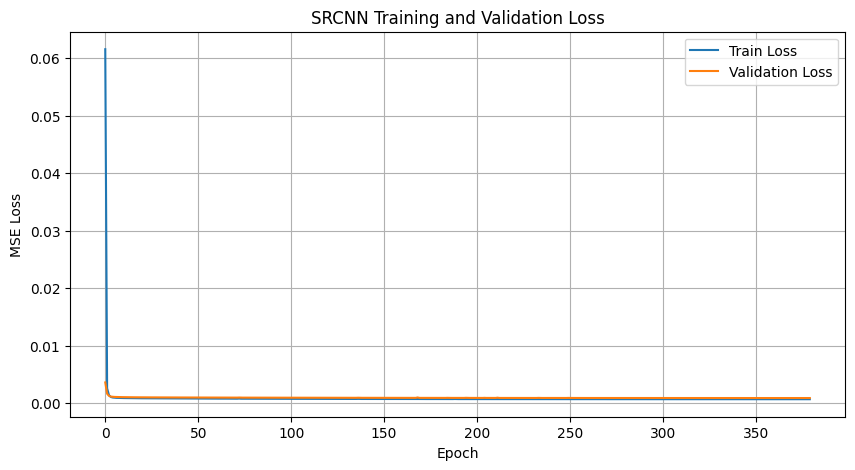

In [5]:
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('SRCNN Training and Validation Loss')
plt.legend()
plt.grid()
plt.show()

In [8]:
model = MODEL_CLASS(upsample_factor=factor, middle_k_size=3)
weights, _ = load_results(model_name, factor)
model.load_state_dict(weights)
model.to(device)

SRCNN(
  (body): Sequential(
    (0): Conv2d(1, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(32, 1, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  )
)

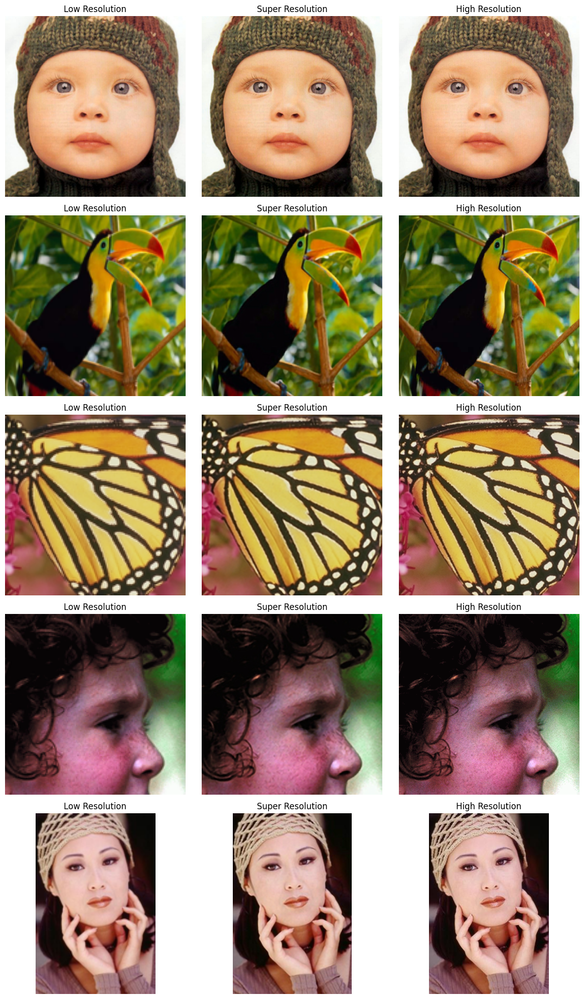

Set 5, Factor 2 - Average PSNR: 34.72 dB, SSIM: 0.9273


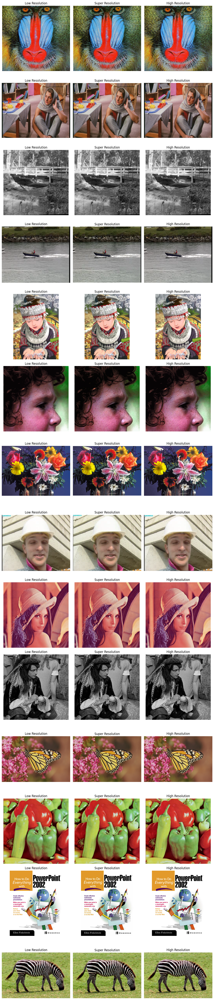

Set 14, Factor 2 - Average PSNR: 30.70 dB, SSIM: 0.8666


In [9]:
evaluate_model_on_sets(model, sets=[5, 14], factor_list=[2], device=device, show_plots=True)